# Modeling

In [1]:
!pwd

/home/jovyan/work/cold_start_models


In [2]:
from sklearn import metrics
import catboost as cat
from catboost import CatBoostRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error as mae, r2_score as r2
from scipy.stats import uniform, randint

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pickle
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from sklearn.model_selection import train_test_split


import warnings
warnings.filterwarnings("ignore")


def mae(y_gt, Y_pr):
    return metrics.mean_absolute_error(y_gt, Y_pr)

def mse(y_gt, Y_pr):
    return metrics.mean_squared_error(y_gt, Y_pr)

def rmse(y_gt, Y_pr):
    my_mse = mse(y_gt, Y_pr)
    return np.sqrt(my_mse)

def medae(y_gt, Y_pr):
    return metrics.median_absolute_error(y_gt, Y_pr)

def R2(y_gt, Y_pr):
    return metrics.r2_score(y_gt, Y_pr)

def calc_metrics(y_test, y_pred, X):
    
    y_test = target_transformer.inverse_transform(y_test)
    y_pred = target_transformer.inverse_transform(pd.Series(y_pred))

    mse1 = mse(y_test, y_pred)

    rmse1 = rmse(y_test, y_pred)

    mae1 = mae(y_test, y_pred)

    medae1 = medae(y_test, y_pred)

    R21 = R2(y_test, y_pred)
    
    adj_r2 = 1 - (1-r2(y_test, y_pred)) * (len(y)-1)/(len(y)-X.shape[1]-1)

    print('*** VAL **: ')
    print("MSE:   {}\nRMSE:  {}\nR2:    {}\nMAE:   {}\nMedAE: {}\nAdj_R2:  {}".format(mse1, rmse1, R21, mae1, medae1, adj_r2))
    print('-'*30)


def get_importance(train_dataset, cat_model, title='Catboost feature importance', save_fig=False, file_name='cat_feature_importance.png'):
    imp = cat_model.get_feature_importance(data=train_dataset)
    fig, axes = plt.subplots(1, 1, figsize=(12, 8))
    axes.barh(width=imp, y=cat_model.feature_names_)
    axes.set_title(title)
    if save_fig:
        plt.savefig(file_name)
    plt.show()
    

def draw_target_distr(y_test, y_pred, save_fig=False, file_name='cat_distribution'):
    plt.figure(figsize=(12, 5))
    sns.distplot(y_test)
    sns.distplot(y_pred)
    plt.legend(['test', 'pred'])
    if save_fig:
        plt.savefig(file_name)
    plt.show()

    
def draw_residuals(y_test, y_pred, save_fig=False,
                   file_name='cat_residuals.png'):
    y_test = target_transformer.inverse_transform(y_test)
    y_pred = target_transformer.inverse_transform(pd.Series(y_pred))  / MULTIPLIER
    sns.residplot(x=y_test, y=y_pred)
    if save_fig:
        plt.savefig(file_name)
    plt.show()
    
    
class TargetTransformer:
    def __init__(self, denominator=1):
        self.scale = denominator
        
    def inverse_transform(self, feature):
        return feature.apply(lambda x: np.expm1(x))
    
    def transform(self, feature):
        return feature.apply(lambda x: np.log1p(x))

In [3]:
with open('/home/jovyan/work/cold_start_models/dataset_0.pkl', 'rb') as f:
    df_pr = pickle.load(f)

In [4]:
df_pr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9483 entries, 0 to 9482
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age_access_type    9483 non-null   int64  
 1   average_rating     8958 non-null   float64
 2   duration           9483 non-null   float64
 3   type               9483 non-null   object 
 4   name               9483 non-null   object 
 5   release_year       9483 non-null   object 
 6   target             9483 non-null   float64
 7   subscription_only  9483 non-null   object 
 8   actor_0            9483 non-null   object 
 9   actor_1            9483 non-null   object 
 10  actor_2            9483 non-null   object 
 11  actor_3            9483 non-null   object 
 12  actor_4            9483 non-null   object 
 13  country_0          9483 non-null   object 
 14  genre_0            9483 non-null   object 
 15  genre_1            9483 non-null   object 
 16  genre_2            9483 

# 0

In [5]:
cat_features = ['type', 'subscription_only', 'actor_0', 'actor_1',
               'actor_2', 'actor_3', 'actor_4', 'country_0', 'genre_0', 'genre_1',
               'genre_2', 'director_0', 'SUBSCRIPTION', 'AVOD', 'DTO', 'RENT', 'release_year']
num_features = ['age_access_type', 'average_rating', 'duration']

target_transformer = TargetTransformer()

In [7]:
MULTIPLIER = 100
X, y = df_pr.drop(['target', 'name'], axis=1), df_pr['target'] * MULTIPLIER
y = target_transformer.transform(y)

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=True)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.2, random_state=42, shuffle=True)
train_dataset = cat.Pool(X_train, y_train,
                         cat_features=cat_features,   
                        ) 
test_dataset = cat.Pool(X_test, y_test,
                         cat_features=cat_features,
                       )
val_dataset = cat.Pool(X_val, y_val,
                       cat_features=cat_features,
                      )

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


In [9]:
cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
    'cat_features': cat_features,
    'iterations': 10000, 
}

cat_model = cat.CatBoostRegressor(**cat_params)

cat_model.fit(
    train_dataset,
    eval_set=val_dataset,
    early_stopping_rounds=50,
    verbose=100,
    plot=False
)

Learning rate set to 0.017502
0:	learn: 0.0427296	test: 0.0484102	best: 0.0484102 (0)	total: 68.3ms	remaining: 11m 23s
100:	learn: 0.0337421	test: 0.0403395	best: 0.0403395 (100)	total: 1.12s	remaining: 1m 49s
200:	learn: 0.0313456	test: 0.0383589	best: 0.0383589 (200)	total: 2.12s	remaining: 1m 43s
300:	learn: 0.0302861	test: 0.0379456	best: 0.0379318 (296)	total: 3.1s	remaining: 1m 39s
400:	learn: 0.0297550	test: 0.0375475	best: 0.0375386 (386)	total: 4.07s	remaining: 1m 37s
500:	learn: 0.0293162	test: 0.0373313	best: 0.0373288 (470)	total: 5.06s	remaining: 1m 35s
600:	learn: 0.0290098	test: 0.0371066	best: 0.0370573 (565)	total: 6.06s	remaining: 1m 34s
700:	learn: 0.0288265	test: 0.0369170	best: 0.0368892 (663)	total: 7.04s	remaining: 1m 33s
800:	learn: 0.0285773	test: 0.0367559	best: 0.0367383 (792)	total: 8.03s	remaining: 1m 32s
900:	learn: 0.0283641	test: 0.0365001	best: 0.0364969 (892)	total: 9.06s	remaining: 1m 31s
1000:	learn: 0.0281018	test: 0.0362567	best: 0.0362499 (999)	to

In [10]:
cat_model.save_model('0')

In [11]:
y_pred = cat_model.predict(X_test)

In [12]:
calc_metrics(y_test, y_pred, X)

*** VAL **: 
MSE:   0.011585507730779461
RMSE:  0.10763599644533171
R2:    0.391603871754446
MAE:   0.03618660857243349
MedAE: 0.011371708801664925
Adj_R2:  0.39031789388878213
------------------------------


In [307]:
get_metrics(y_test, y_pred, X)

MAE 0.032349631636097775
R2 0.2441480198472653
Adj R2 0.24258803050247835


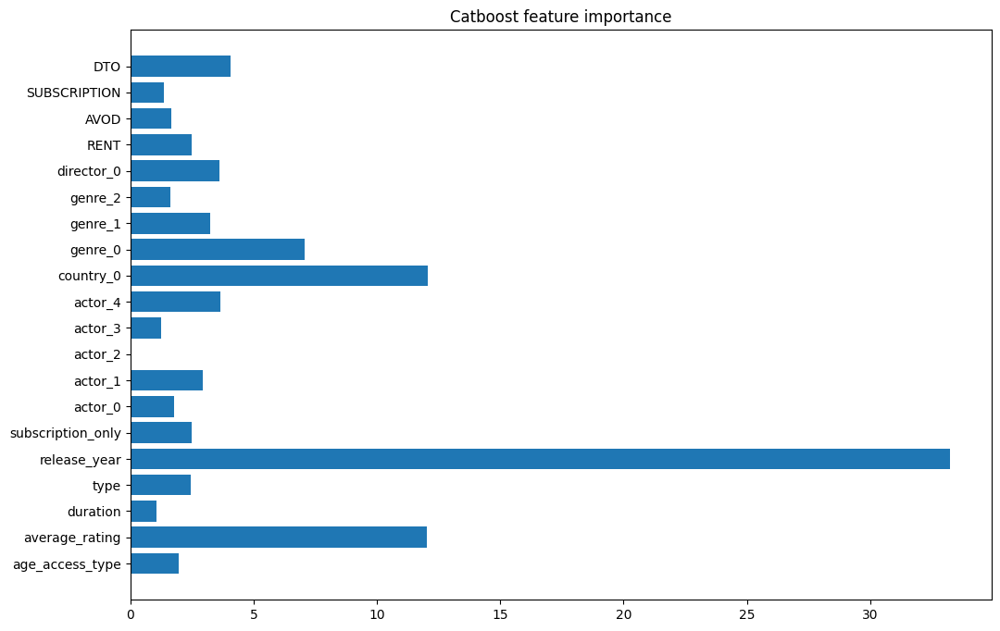

In [13]:
get_importance(train_dataset, cat_model, title='Catboost feature importance', save_fig=False, file_name='cat_feature_importance.png')

/tmp/ipykernel_1288/2698331858.py:68: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test)
/tmp/ipykernel_1288/2698331858.py:69: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_pred)


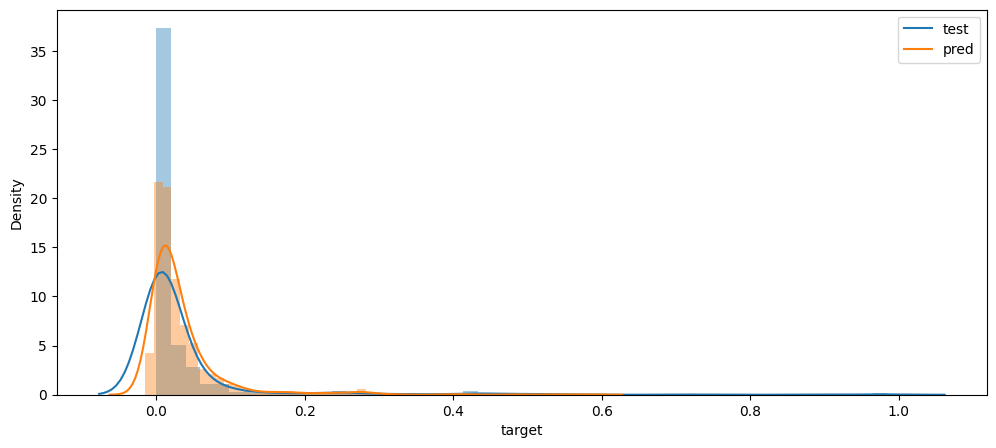

In [14]:
draw_target_distr(y_test, y_pred, save_fig=False, file_name='cat_distribution')

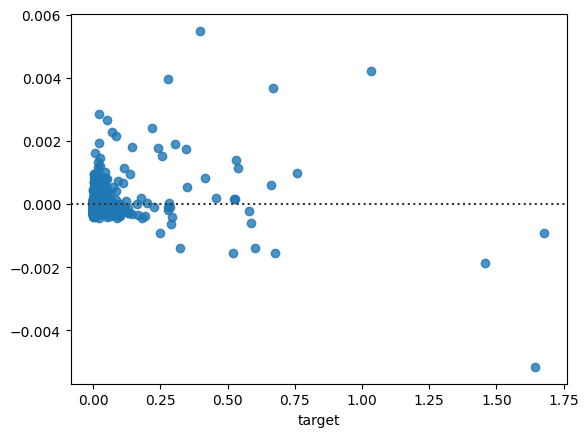

In [15]:
draw_residuals(y_test, y_pred, save_fig=False)

In [16]:
len(y_pred[y_pred <= 0])

80

# 0_1 no release_year

In [19]:
cat_features = ['type', 'subscription_only', 'actor_0', 'actor_1',
               'actor_2', 'actor_3', 'actor_4', 'country_0', 'genre_0', 'genre_1',
               'genre_2', 'director_0', 'SUBSCRIPTION', 'AVOD', 'DTO', 'RENT']

In [20]:
MULTIPLIER = 100
X, y = df_pr.drop(['target', 'name', 'release_year'], axis=1), df_pr['target'] * MULTIPLIER
y = target_transformer.transform(y)

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=True)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.2, random_state=42, shuffle=True)
train_dataset = cat.Pool(X_train, y_train,
                         cat_features=cat_features,   
                        ) 
test_dataset = cat.Pool(X_test, y_test,
                         cat_features=cat_features,
                       )
val_dataset = cat.Pool(X_val, y_val,
                       cat_features=cat_features,
                      )

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


In [22]:
cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
    'cat_features': cat_features,
    'iterations': 10000, 
}

cat_model = cat.CatBoostRegressor(**cat_params)

cat_model.fit(
    train_dataset,
    eval_set=val_dataset,
    early_stopping_rounds=50,
    verbose=100,
    plot=False
)

Learning rate set to 0.017502
0:	learn: 0.0428925	test: 0.0486186	best: 0.0486186 (0)	total: 7.44ms	remaining: 1m 14s
100:	learn: 0.0399745	test: 0.0460842	best: 0.0460842 (100)	total: 927ms	remaining: 1m 30s
200:	learn: 0.0387791	test: 0.0447945	best: 0.0447945 (200)	total: 1.92s	remaining: 1m 33s
300:	learn: 0.0381139	test: 0.0442867	best: 0.0442636 (295)	total: 2.89s	remaining: 1m 33s
400:	learn: 0.0376155	test: 0.0439177	best: 0.0439104 (399)	total: 3.9s	remaining: 1m 33s
500:	learn: 0.0372710	test: 0.0436981	best: 0.0436981 (500)	total: 4.94s	remaining: 1m 33s
600:	learn: 0.0369400	test: 0.0435321	best: 0.0435220 (580)	total: 5.97s	remaining: 1m 33s
700:	learn: 0.0366369	test: 0.0432502	best: 0.0432137 (696)	total: 7.01s	remaining: 1m 33s
800:	learn: 0.0363179	test: 0.0430999	best: 0.0430433 (792)	total: 8.08s	remaining: 1m 32s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.04304329703
bestIteration = 792

Shrink model to first 793 iterations.


In [23]:
cat_model.save_model('0_1')

In [24]:
y_pred = cat_model.predict(X_test)

In [25]:
calc_metrics(y_test, y_pred, X)

*** VAL **: 
MSE:   0.016946775572876712
RMSE:  0.13017978173616943
R2:    0.11006467007114495
MAE:   0.04578423972108794
MedAE: 0.023948164673349225
Adj_R2:  0.10827784017907605
------------------------------


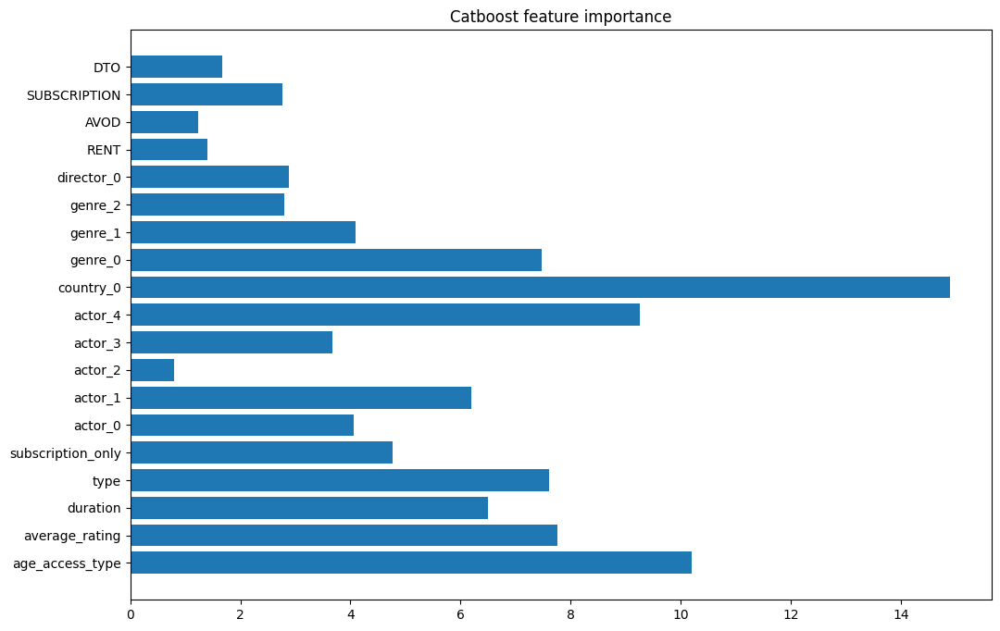

In [26]:
get_importance(train_dataset, cat_model, title='Catboost feature importance', save_fig=False, file_name='cat_feature_importance.png')

/tmp/ipykernel_1288/2698331858.py:68: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test)
/tmp/ipykernel_1288/2698331858.py:69: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_pred)


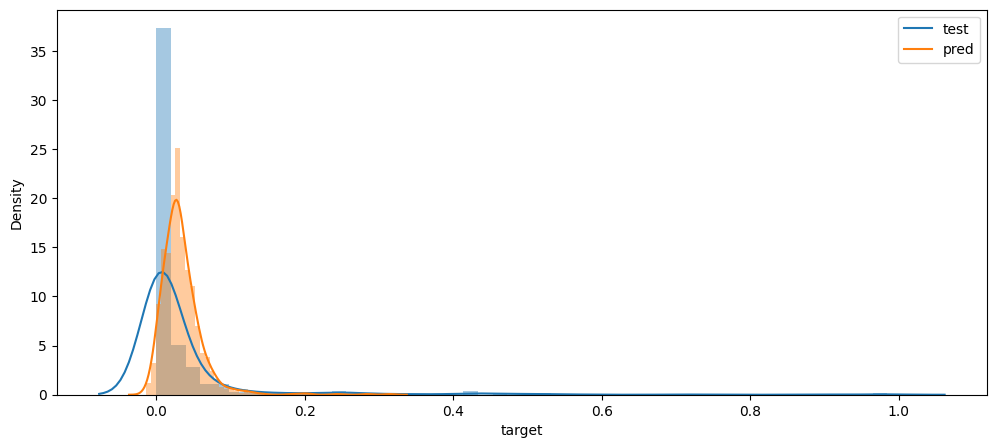

In [27]:
draw_target_distr(y_test, y_pred, save_fig=False, file_name='cat_distribution')

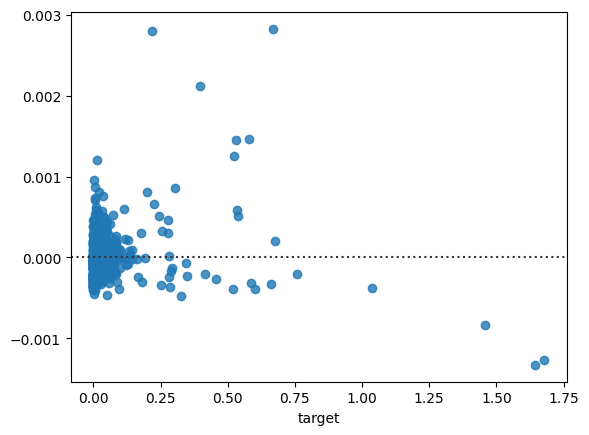

In [28]:
draw_residuals(y_test, y_pred, save_fig=False)

In [29]:
len(y_pred[y_pred <= 0])

24

### 0_2 release_year numeric

In [30]:
cat_features = ['type', 'subscription_only', 'actor_0', 'actor_1',
               'actor_2', 'actor_3', 'actor_4', 'country_0', 'genre_0', 'genre_1',
               'genre_2', 'director_0', 'SUBSCRIPTION', 'AVOD', 'DTO', 'RENT']

In [31]:
MULTIPLIER = 100
X, y = df_pr.drop(['target', 'name'], axis=1), df_pr['target'] * MULTIPLIER
y = target_transformer.transform(y)

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=True)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.2, random_state=42, shuffle=True)
train_dataset = cat.Pool(X_train, y_train,
                         cat_features=cat_features,   
                        ) 
test_dataset = cat.Pool(X_test, y_test,
                         cat_features=cat_features,
                       )
val_dataset = cat.Pool(X_val, y_val,
                       cat_features=cat_features,
                      )

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


In [33]:
cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
    'cat_features': cat_features,
    'iterations': 10000, 
}

cat_model = cat.CatBoostRegressor(**cat_params)

cat_model.fit(
    train_dataset,
    eval_set=val_dataset,
    early_stopping_rounds=50,
    verbose=100,
    plot=False
)

Learning rate set to 0.017502
0:	learn: 0.0426815	test: 0.0483802	best: 0.0483802 (0)	total: 12.6ms	remaining: 2m 5s
100:	learn: 0.0335510	test: 0.0398036	best: 0.0398036 (100)	total: 986ms	remaining: 1m 36s
200:	learn: 0.0307474	test: 0.0372088	best: 0.0372088 (200)	total: 2.01s	remaining: 1m 37s
300:	learn: 0.0296625	test: 0.0366080	best: 0.0365886 (296)	total: 3.06s	remaining: 1m 38s
400:	learn: 0.0290861	test: 0.0363060	best: 0.0363060 (400)	total: 4.09s	remaining: 1m 37s
500:	learn: 0.0287175	test: 0.0360561	best: 0.0360561 (500)	total: 5.09s	remaining: 1m 36s
600:	learn: 0.0283841	test: 0.0358736	best: 0.0358736 (600)	total: 6.08s	remaining: 1m 35s
700:	learn: 0.0281303	test: 0.0356211	best: 0.0356211 (700)	total: 7.12s	remaining: 1m 34s
800:	learn: 0.0278878	test: 0.0352869	best: 0.0352867 (799)	total: 8.16s	remaining: 1m 33s
900:	learn: 0.0276764	test: 0.0351865	best: 0.0351776 (875)	total: 9.22s	remaining: 1m 33s
Stopped by overfitting detector  (50 iterations wait)

bestTest 

In [34]:
cat_model.save_model('0_2')

In [35]:
y_pred = cat_model.predict(X_test)

In [36]:
calc_metrics(y_test, y_pred, X)

*** VAL **: 
MSE:   0.011608884117877024
RMSE:  0.10774453173074272
R2:    0.39037629470447854
MAE:   0.03630786978855168
MedAE: 0.011920619915017406
Adj_R2:  0.389087722087071
------------------------------


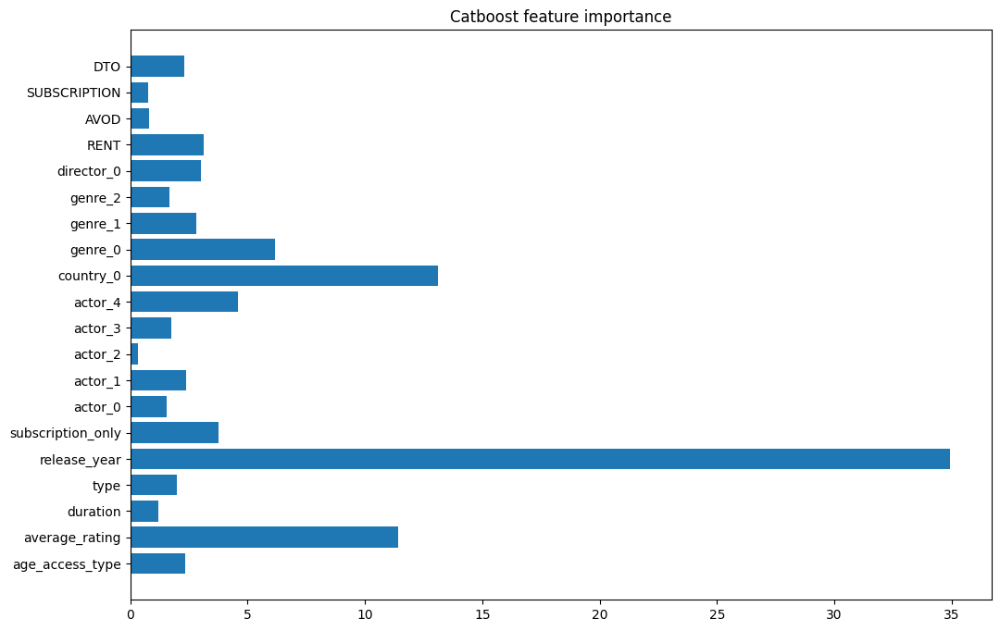

In [37]:
get_importance(train_dataset, cat_model, title='Catboost feature importance', save_fig=False, file_name='cat_feature_importance.png')

/tmp/ipykernel_1288/2698331858.py:68: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test)
/tmp/ipykernel_1288/2698331858.py:69: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_pred)


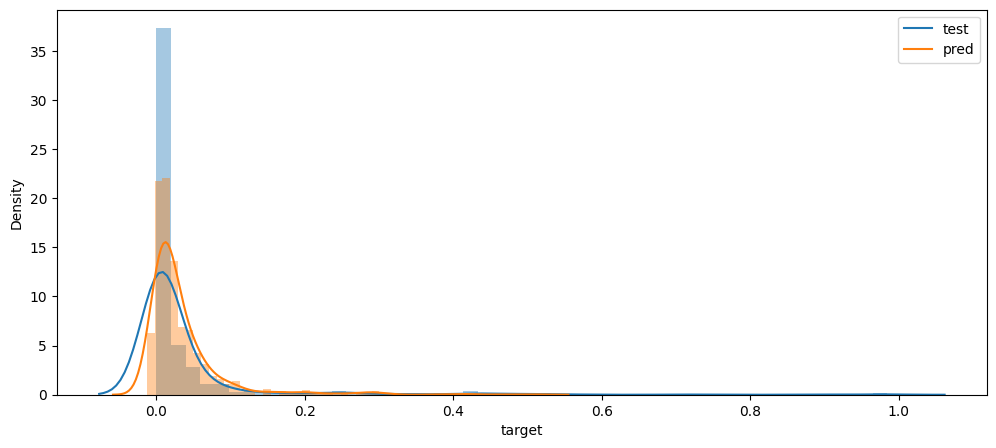

In [38]:
draw_target_distr(y_test, y_pred, save_fig=False, file_name='cat_distribution')

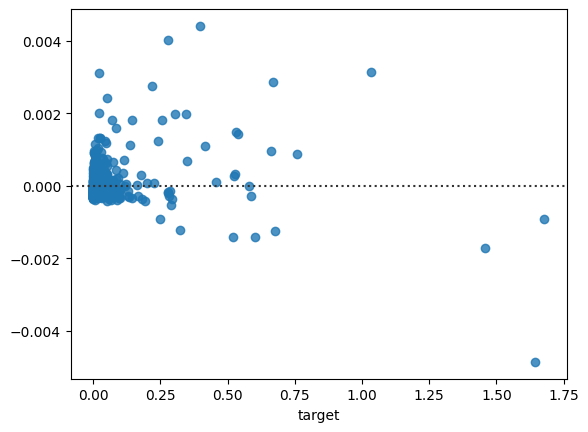

In [39]:
draw_residuals(y_test, y_pred, save_fig=False)

In [40]:
len(y_pred[y_pred <= 0])

74

## 0_2_finetuned

In [57]:
cat_features = ['type', 'subscription_only', 'actor_0', 'actor_1',
               'actor_2', 'actor_3', 'actor_4', 'country_0', 'genre_0', 'genre_1',
               'genre_2', 'director_0', 'SUBSCRIPTION', 'AVOD', 'DTO', 'RENT', 'release_year']

In [58]:
MULTIPLIER = 100
X, y = df_pr.drop(['target', 'name'], axis=1), df_pr['target'] * MULTIPLIER
y = target_transformer.transform(y)

In [59]:
cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
    'cat_features': cat_features
}

train_dataset = cat.Pool(X_train, y_train,
                         cat_features=cat_features,
                         
                        ) 

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


In [60]:
parameters_distr = {'depth': randint(5, 10),
                    'learning_rate': uniform(0.01, 0.3),
                    'iterations': randint(500, 10000),
                    'l2_leaf_reg':  uniform(0.01, 0.5)
                     }

cat_model = cat.CatBoostRegressor(**cat_params)
grid = RandomizedSearchCV(estimator=cat_model, param_distributions=parameters_distr, scoring='neg_mean_squared_error',
                          cv=3, n_jobs=10, verbose=0)

grid.fit(X_train, y_train)

cat_model = grid.best_estimator_
cat_model.save_model('0_2_finetuned')

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,
/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,
/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,
/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, emb

0:	learn: 0.0415061	total: 294ms	remaining: 42m 18s
1:	learn: 0.0402770	total: 559ms	remaining: 40m 17s
2:	learn: 0.0393255	total: 721ms	remaining: 34m 38s
3:	learn: 0.0383611	total: 916ms	remaining: 32m 58s
4:	learn: 0.0374704	total: 1.06s	remaining: 30m 34s
5:	learn: 0.0367431	total: 1.17s	remaining: 28m 10s
6:	learn: 0.0362948	total: 1.36s	remaining: 27m 53s
7:	learn: 0.0357577	total: 1.51s	remaining: 27m 6s
8:	learn: 0.0354146	total: 1.6s	remaining: 25m 33s
9:	learn: 0.0350148	total: 1.66s	remaining: 23m 53s
10:	learn: 0.0348227	total: 1.85s	remaining: 24m 12s
11:	learn: 0.0343959	total: 2.08s	remaining: 24m 58s
12:	learn: 0.0342054	total: 2.18s	remaining: 24m 10s
13:	learn: 0.0339970	total: 2.34s	remaining: 24m 2s
14:	learn: 0.0337940	total: 2.43s	remaining: 23m 19s
15:	learn: 0.0336139	total: 2.48s	remaining: 22m 20s
16:	learn: 0.0334811	total: 2.58s	remaining: 21m 47s
17:	learn: 0.0333180	total: 2.74s	remaining: 21m 54s
18:	learn: 0.0330549	total: 2.97s	remaining: 22m 26s
19:	le

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


3300:	learn: 0.0095813	total: 18m 22s	remaining: 44.4s
3301:	learn: 0.0095789	total: 18m 22s	remaining: 44.1s
3302:	learn: 0.0095751	total: 18m 22s	remaining: 43.7s
3303:	learn: 0.0095741	total: 18m 23s	remaining: 43.4s
3304:	learn: 0.0095717	total: 18m 24s	remaining: 43.1s
3305:	learn: 0.0095681	total: 18m 24s	remaining: 42.8s
3306:	learn: 0.0095661	total: 18m 24s	remaining: 42.4s
3307:	learn: 0.0095647	total: 18m 25s	remaining: 42.1s
3308:	learn: 0.0095634	total: 18m 25s	remaining: 41.8s
3309:	learn: 0.0095608	total: 18m 26s	remaining: 41.4s
3310:	learn: 0.0095571	total: 18m 26s	remaining: 41.1s
3311:	learn: 0.0095564	total: 18m 27s	remaining: 40.8s
3312:	learn: 0.0095557	total: 18m 28s	remaining: 40.5s
3313:	learn: 0.0095463	total: 18m 29s	remaining: 40.2s
3314:	learn: 0.0095454	total: 18m 30s	remaining: 39.8s
3315:	learn: 0.0095442	total: 18m 30s	remaining: 39.5s
3316:	learn: 0.0095411	total: 18m 30s	remaining: 39.2s
3317:	learn: 0.0095366	total: 18m 30s	remaining: 38.8s
3318:	lear

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


3393:	learn: 0.0006074	total: 34m 33s	remaining: 1m 23s
3394:	learn: 0.0006069	total: 34m 34s	remaining: 1m 22s
3395:	learn: 0.0006059	total: 34m 34s	remaining: 1m 21s
3396:	learn: 0.0006055	total: 34m 36s	remaining: 1m 21s
3397:	learn: 0.0006047	total: 34m 37s	remaining: 1m 20s
3398:	learn: 0.0006043	total: 34m 38s	remaining: 1m 20s
3399:	learn: 0.0006039	total: 34m 39s	remaining: 1m 19s
3400:	learn: 0.0006033	total: 34m 39s	remaining: 1m 18s
3401:	learn: 0.0006017	total: 34m 39s	remaining: 1m 18s
3402:	learn: 0.0006017	total: 34m 40s	remaining: 1m 17s
3403:	learn: 0.0006013	total: 34m 42s	remaining: 1m 17s
3404:	learn: 0.0006009	total: 34m 43s	remaining: 1m 16s
3405:	learn: 0.0006006	total: 34m 44s	remaining: 1m 15s
3406:	learn: 0.0006000	total: 34m 45s	remaining: 1m 15s
3407:	learn: 0.0005996	total: 34m 46s	remaining: 1m 14s
3408:	learn: 0.0005988	total: 34m 47s	remaining: 1m 14s
3409:	learn: 0.0005987	total: 34m 48s	remaining: 1m 13s
3410:	learn: 0.0005986	total: 34m 48s	remaining:

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,
/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


4099:	learn: 0.0025305	total: 35m 24s	remaining: 36m 29s
4100:	learn: 0.0025299	total: 35m 24s	remaining: 36m 28s
4101:	learn: 0.0025293	total: 35m 25s	remaining: 36m 28s
4102:	learn: 0.0025279	total: 35m 26s	remaining: 36m 28s
4103:	learn: 0.0025273	total: 35m 26s	remaining: 36m 27s
4104:	learn: 0.0025268	total: 35m 28s	remaining: 36m 28s
4105:	learn: 0.0025267	total: 35m 29s	remaining: 36m 28s
4106:	learn: 0.0025261	total: 35m 29s	remaining: 36m 27s
4107:	learn: 0.0025258	total: 35m 30s	remaining: 36m 27s
4108:	learn: 0.0025249	total: 35m 31s	remaining: 36m 27s
4109:	learn: 0.0025242	total: 35m 31s	remaining: 36m 26s
4110:	learn: 0.0025238	total: 35m 32s	remaining: 36m 26s
4111:	learn: 0.0025226	total: 35m 32s	remaining: 36m 25s
4112:	learn: 0.0025221	total: 35m 33s	remaining: 36m 25s
4113:	learn: 0.0025216	total: 35m 33s	remaining: 36m 24s
4114:	learn: 0.0025212	total: 35m 34s	remaining: 36m 24s
4115:	learn: 0.0025218	total: 35m 34s	remaining: 36m 23s
4116:	learn: 0.0025206	total: 3

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


5401:	learn: 0.0013706	total: 50m 1s	remaining: 27m 4s
5402:	learn: 0.0013699	total: 50m 1s	remaining: 27m 4s
5403:	learn: 0.0013696	total: 50m 2s	remaining: 27m 3s
5404:	learn: 0.0013688	total: 50m 3s	remaining: 27m 2s
5405:	learn: 0.0013684	total: 50m 3s	remaining: 27m 2s
5406:	learn: 0.0013676	total: 50m 3s	remaining: 27m 1s
5407:	learn: 0.0013670	total: 50m 4s	remaining: 27m 1s
5408:	learn: 0.0013664	total: 50m 4s	remaining: 27m
5409:	learn: 0.0013660	total: 50m 5s	remaining: 26m 59s
5410:	learn: 0.0013656	total: 50m 5s	remaining: 26m 59s
5411:	learn: 0.0013646	total: 50m 6s	remaining: 26m 58s
5412:	learn: 0.0013637	total: 50m 7s	remaining: 26m 58s
5413:	learn: 0.0013629	total: 50m 7s	remaining: 26m 57s
5414:	learn: 0.0013624	total: 50m 8s	remaining: 26m 57s
5415:	learn: 0.0013620	total: 50m 8s	remaining: 26m 56s
5416:	learn: 0.0013614	total: 50m 9s	remaining: 26m 56s
5417:	learn: 0.0013598	total: 50m 10s	remaining: 26m 55s
5418:	learn: 0.0013593	total: 50m 11s	remaining: 26m 55s
5

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


1333:	learn: 0.0134621	total: 27m 37s	remaining: 41m 35s
1334:	learn: 0.0134610	total: 27m 38s	remaining: 41m 34s
1335:	learn: 0.0134536	total: 27m 40s	remaining: 41m 34s
1336:	learn: 0.0134469	total: 27m 41s	remaining: 41m 33s
1337:	learn: 0.0134437	total: 27m 43s	remaining: 41m 33s
1338:	learn: 0.0134413	total: 27m 45s	remaining: 41m 32s
1339:	learn: 0.0134408	total: 27m 47s	remaining: 41m 32s
1340:	learn: 0.0134379	total: 27m 49s	remaining: 41m 31s
1341:	learn: 0.0134351	total: 27m 49s	remaining: 41m 29s
1342:	learn: 0.0134297	total: 27m 50s	remaining: 41m 28s
1343:	learn: 0.0134251	total: 27m 51s	remaining: 41m 26s
1344:	learn: 0.0134226	total: 27m 52s	remaining: 41m 25s
1345:	learn: 0.0134190	total: 27m 53s	remaining: 41m 23s
1346:	learn: 0.0134167	total: 27m 55s	remaining: 41m 22s
1347:	learn: 0.0134139	total: 27m 56s	remaining: 41m 21s
1348:	learn: 0.0134095	total: 27m 57s	remaining: 41m 18s
1349:	learn: 0.0133998	total: 27m 58s	remaining: 41m 17s
1350:	learn: 0.0133969	total: 2

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


6824:	learn: 0.0008971	total: 1h 6m 33s	remaining: 14m 38s
6825:	learn: 0.0008964	total: 1h 6m 34s	remaining: 14m 37s
6826:	learn: 0.0008959	total: 1h 6m 35s	remaining: 14m 37s
6827:	learn: 0.0008953	total: 1h 6m 36s	remaining: 14m 36s
6828:	learn: 0.0008950	total: 1h 6m 36s	remaining: 14m 36s
6829:	learn: 0.0008945	total: 1h 6m 37s	remaining: 14m 35s
6830:	learn: 0.0008943	total: 1h 6m 38s	remaining: 14m 35s
6831:	learn: 0.0008938	total: 1h 6m 38s	remaining: 14m 34s
6832:	learn: 0.0008937	total: 1h 6m 39s	remaining: 14m 33s
6833:	learn: 0.0008935	total: 1h 6m 39s	remaining: 14m 33s
6834:	learn: 0.0008934	total: 1h 6m 40s	remaining: 14m 32s
6835:	learn: 0.0008933	total: 1h 6m 40s	remaining: 14m 32s
6836:	learn: 0.0008931	total: 1h 6m 41s	remaining: 14m 31s
6837:	learn: 0.0008927	total: 1h 6m 42s	remaining: 14m 30s
6838:	learn: 0.0008923	total: 1h 6m 42s	remaining: 14m 30s
6839:	learn: 0.0008920	total: 1h 6m 43s	remaining: 14m 29s
6840:	learn: 0.0008914	total: 1h 6m 43s	remaining: 14m 2

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


8582:	learn: 0.0034622	total: 1h 7m 12s	remaining: 29.1s
8583:	learn: 0.0034623	total: 1h 7m 13s	remaining: 28.7s
8584:	learn: 0.0034623	total: 1h 7m 13s	remaining: 28.2s
8585:	learn: 0.0034611	total: 1h 7m 13s	remaining: 27.7s
8586:	learn: 0.0034610	total: 1h 7m 14s	remaining: 27.2s
8587:	learn: 0.0034599	total: 1h 7m 15s	remaining: 26.8s
8588:	learn: 0.0034592	total: 1h 7m 15s	remaining: 26.3s
8589:	learn: 0.0034585	total: 1h 7m 15s	remaining: 25.8s
8590:	learn: 0.0034574	total: 1h 7m 16s	remaining: 25.4s
8591:	learn: 0.0034566	total: 1h 7m 16s	remaining: 24.9s
8592:	learn: 0.0034561	total: 1h 7m 17s	remaining: 24.4s
8593:	learn: 0.0034549	total: 1h 7m 18s	remaining: 24s
8594:	learn: 0.0034545	total: 1h 7m 18s	remaining: 23.5s
8595:	learn: 0.0034543	total: 1h 7m 19s	remaining: 23s
8596:	learn: 0.0034542	total: 1h 7m 20s	remaining: 22.6s
8597:	learn: 0.0034535	total: 1h 7m 20s	remaining: 22.1s
8598:	learn: 0.0034531	total: 1h 7m 21s	remaining: 21.6s
8599:	learn: 0.0034526	total: 1h 7m

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


90:	learn: 0.0281766	total: 50.6s	remaining: 1h 25m 4s
91:	learn: 0.0281721	total: 51s	remaining: 1h 24m 48s
92:	learn: 0.0280756	total: 51.8s	remaining: 1h 25m 5s
93:	learn: 0.0280485	total: 52.7s	remaining: 1h 25m 43s
94:	learn: 0.0279938	total: 53.2s	remaining: 1h 25m 38s
95:	learn: 0.0279562	total: 53.9s	remaining: 1h 25m 50s
96:	learn: 0.0279224	total: 54.8s	remaining: 1h 26m 17s
97:	learn: 0.0278949	total: 55.1s	remaining: 1h 25m 56s
98:	learn: 0.0278657	total: 55.9s	remaining: 1h 26m 16s
99:	learn: 0.0278274	total: 56.9s	remaining: 1h 26m 51s
100:	learn: 0.0277736	total: 57.1s	remaining: 1h 26m 20s
101:	learn: 0.0277472	total: 57.3s	remaining: 1h 25m 47s
102:	learn: 0.0277258	total: 58.1s	remaining: 1h 26m 7s
103:	learn: 0.0277151	total: 58.4s	remaining: 1h 25m 46s
104:	learn: 0.0276674	total: 59.5s	remaining: 1h 26m 30s
105:	learn: 0.0276413	total: 59.8s	remaining: 1h 26m 7s
106:	learn: 0.0276293	total: 1m	remaining: 1h 26m 8s
107:	learn: 0.0276260	total: 1m 1s	remaining: 1h 26

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


1428:	learn: 0.0142886	total: 13m 8s	remaining: 19m 4s
1429:	learn: 0.0142872	total: 13m 8s	remaining: 19m 3s
1430:	learn: 0.0142805	total: 13m 9s	remaining: 19m 3s
1431:	learn: 0.0142769	total: 13m 10s	remaining: 19m 2s
1432:	learn: 0.0142766	total: 13m 11s	remaining: 19m 3s
1433:	learn: 0.0142728	total: 13m 11s	remaining: 19m 2s
1434:	learn: 0.0142697	total: 13m 12s	remaining: 19m 2s
1435:	learn: 0.0142640	total: 13m 12s	remaining: 19m 1s
1436:	learn: 0.0142591	total: 13m 13s	remaining: 19m
1437:	learn: 0.0142565	total: 13m 13s	remaining: 18m 59s
1438:	learn: 0.0142521	total: 13m 14s	remaining: 18m 59s
1439:	learn: 0.0142482	total: 13m 14s	remaining: 18m 58s
1440:	learn: 0.0142460	total: 13m 15s	remaining: 18m 57s
1441:	learn: 0.0142381	total: 13m 15s	remaining: 18m 57s
1442:	learn: 0.0142346	total: 13m 15s	remaining: 18m 56s
1443:	learn: 0.0142348	total: 13m 16s	remaining: 18m 55s
1444:	learn: 0.0142297	total: 13m 17s	remaining: 18m 55s
1445:	learn: 0.0142270	total: 13m 17s	remainin

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,
/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


1628:	learn: 0.0135896	total: 14m 32s	remaining: 1h 8m 7s
1629:	learn: 0.0135884	total: 14m 32s	remaining: 1h 8m 6s
1630:	learn: 0.0135873	total: 14m 32s	remaining: 1h 8m 5s
1631:	learn: 0.0135776	total: 14m 33s	remaining: 1h 8m 3s
1632:	learn: 0.0135750	total: 14m 33s	remaining: 1h 8m 2s
1633:	learn: 0.0135651	total: 14m 34s	remaining: 1h 8m 3s
1634:	learn: 0.0135633	total: 14m 34s	remaining: 1h 8m 1s
1635:	learn: 0.0135562	total: 14m 35s	remaining: 1h 8m 1s
1636:	learn: 0.0135518	total: 14m 35s	remaining: 1h 8m
1637:	learn: 0.0135452	total: 14m 36s	remaining: 1h 8m 1s
1638:	learn: 0.0135339	total: 14m 37s	remaining: 1h 8m 1s
1639:	learn: 0.0135359	total: 14m 38s	remaining: 1h 8m 2s
1640:	learn: 0.0135344	total: 14m 38s	remaining: 1h 8m 2s
1641:	learn: 0.0135316	total: 14m 39s	remaining: 1h 8m 2s
1642:	learn: 0.0135266	total: 14m 39s	remaining: 1h 8m 1s
1643:	learn: 0.0135201	total: 14m 40s	remaining: 1h 8m
1644:	learn: 0.0135083	total: 14m 40s	remaining: 1h 7m 59s
1645:	learn: 0.0135

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


3472:	learn: 0.0076654	total: 32m 5s	remaining: 53m 31s
3473:	learn: 0.0076676	total: 32m 6s	remaining: 53m 30s
3474:	learn: 0.0076634	total: 32m 6s	remaining: 53m 29s
3475:	learn: 0.0076618	total: 32m 6s	remaining: 53m 28s
3476:	learn: 0.0076576	total: 32m 7s	remaining: 53m 28s
3477:	learn: 0.0076559	total: 32m 8s	remaining: 53m 28s
3478:	learn: 0.0076544	total: 32m 9s	remaining: 53m 28s
3479:	learn: 0.0076515	total: 32m 9s	remaining: 53m 28s
3480:	learn: 0.0076489	total: 32m 10s	remaining: 53m 27s
3481:	learn: 0.0076463	total: 32m 11s	remaining: 53m 27s
3482:	learn: 0.0076437	total: 32m 11s	remaining: 53m 26s
3483:	learn: 0.0076432	total: 32m 12s	remaining: 53m 26s
3484:	learn: 0.0076393	total: 32m 12s	remaining: 53m 24s
3485:	learn: 0.0076400	total: 32m 12s	remaining: 53m 23s
3486:	learn: 0.0076388	total: 32m 13s	remaining: 53m 23s
3487:	learn: 0.0076364	total: 32m 14s	remaining: 53m 23s
3488:	learn: 0.0076354	total: 32m 14s	remaining: 53m 22s
3489:	learn: 0.0076317	total: 32m 14s	r

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


3207:	learn: 0.0074579	total: 1h 6m 3s	remaining: 2m 46s
3208:	learn: 0.0074554	total: 1h 6m 4s	remaining: 2m 45s
3209:	learn: 0.0074534	total: 1h 6m 6s	remaining: 2m 44s
3210:	learn: 0.0074515	total: 1h 6m 7s	remaining: 2m 43s
3211:	learn: 0.0074479	total: 1h 6m 8s	remaining: 2m 41s
3212:	learn: 0.0074434	total: 1h 6m 9s	remaining: 2m 40s
3213:	learn: 0.0074411	total: 1h 6m 11s	remaining: 2m 39s
3214:	learn: 0.0074370	total: 1h 6m 13s	remaining: 2m 38s
3215:	learn: 0.0074317	total: 1h 6m 14s	remaining: 2m 36s
3216:	learn: 0.0074300	total: 1h 6m 15s	remaining: 2m 35s
3217:	learn: 0.0074255	total: 1h 6m 16s	remaining: 2m 34s
3218:	learn: 0.0074223	total: 1h 6m 17s	remaining: 2m 33s
3219:	learn: 0.0074176	total: 1h 6m 19s	remaining: 2m 31s
3220:	learn: 0.0074159	total: 1h 6m 20s	remaining: 2m 30s
3221:	learn: 0.0074145	total: 1h 6m 21s	remaining: 2m 29s
3222:	learn: 0.0074100	total: 1h 6m 22s	remaining: 2m 28s
3223:	learn: 0.0074088	total: 1h 6m 23s	remaining: 2m 27s
3224:	learn: 0.00740

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


3202:	learn: 0.0066113	total: 1h 7m 30s	remaining: 2m 57s
3203:	learn: 0.0066078	total: 1h 7m 32s	remaining: 2m 55s
3204:	learn: 0.0066047	total: 1h 7m 34s	remaining: 2m 54s
3205:	learn: 0.0066025	total: 1h 7m 35s	remaining: 2m 53s
3206:	learn: 0.0065997	total: 1h 7m 35s	remaining: 2m 51s
3207:	learn: 0.0065988	total: 1h 7m 37s	remaining: 2m 50s
3208:	learn: 0.0065963	total: 1h 7m 38s	remaining: 2m 49s
3209:	learn: 0.0065948	total: 1h 7m 39s	remaining: 2m 48s
3210:	learn: 0.0065924	total: 1h 7m 40s	remaining: 2m 46s
3211:	learn: 0.0065907	total: 1h 7m 41s	remaining: 2m 45s
3212:	learn: 0.0065892	total: 1h 7m 43s	remaining: 2m 44s
3213:	learn: 0.0065870	total: 1h 7m 44s	remaining: 2m 43s
3214:	learn: 0.0065831	total: 1h 7m 45s	remaining: 2m 41s
3215:	learn: 0.0065821	total: 1h 7m 46s	remaining: 2m 40s
3216:	learn: 0.0065796	total: 1h 7m 48s	remaining: 2m 39s
3217:	learn: 0.0065768	total: 1h 7m 49s	remaining: 2m 38s
3218:	learn: 0.0065753	total: 1h 7m 50s	remaining: 2m 36s
3219:	learn: 0

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


5059:	learn: 0.0052171	total: 46m 41s	remaining: 38m 48s
5060:	learn: 0.0052159	total: 46m 42s	remaining: 38m 47s
5061:	learn: 0.0052145	total: 46m 43s	remaining: 38m 47s
5062:	learn: 0.0052144	total: 46m 43s	remaining: 38m 46s
5063:	learn: 0.0052120	total: 46m 44s	remaining: 38m 46s
5064:	learn: 0.0052110	total: 46m 45s	remaining: 38m 46s
5065:	learn: 0.0052073	total: 46m 46s	remaining: 38m 45s
5066:	learn: 0.0052065	total: 46m 46s	remaining: 38m 45s
5067:	learn: 0.0052024	total: 46m 46s	remaining: 38m 44s
5068:	learn: 0.0052001	total: 46m 47s	remaining: 38m 43s
5069:	learn: 0.0051991	total: 46m 47s	remaining: 38m 43s
5070:	learn: 0.0051971	total: 46m 48s	remaining: 38m 42s
5071:	learn: 0.0051961	total: 46m 48s	remaining: 38m 41s
5072:	learn: 0.0051924	total: 46m 48s	remaining: 38m 41s
5073:	learn: 0.0051918	total: 46m 49s	remaining: 38m 40s
5074:	learn: 0.0051903	total: 46m 49s	remaining: 38m 39s
5075:	learn: 0.0051897	total: 46m 50s	remaining: 38m 39s
5076:	learn: 0.0051892	total: 4

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


2288:	learn: 0.0020416	total: 31m 10s	remaining: 55m 44s
2289:	learn: 0.0020396	total: 31m 12s	remaining: 55m 45s
2290:	learn: 0.0020388	total: 31m 12s	remaining: 55m 44s
2291:	learn: 0.0020382	total: 31m 13s	remaining: 55m 43s
2292:	learn: 0.0020374	total: 31m 14s	remaining: 55m 42s
2293:	learn: 0.0020352	total: 31m 15s	remaining: 55m 42s
2294:	learn: 0.0020347	total: 31m 17s	remaining: 55m 43s
2295:	learn: 0.0020321	total: 31m 18s	remaining: 55m 43s
2296:	learn: 0.0020300	total: 31m 19s	remaining: 55m 42s
2297:	learn: 0.0020282	total: 31m 20s	remaining: 55m 41s
2298:	learn: 0.0020262	total: 31m 20s	remaining: 55m 40s
2299:	learn: 0.0020249	total: 31m 21s	remaining: 55m 38s
2300:	learn: 0.0020249	total: 31m 21s	remaining: 55m 37s
2301:	learn: 0.0020243	total: 31m 22s	remaining: 55m 36s
2302:	learn: 0.0020208	total: 31m 23s	remaining: 55m 35s
2303:	learn: 0.0020185	total: 31m 24s	remaining: 55m 34s
2304:	learn: 0.0020174	total: 31m 24s	remaining: 55m 33s
2305:	learn: 0.0020168	total: 3

/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


1371:	learn: 0.0051334	total: 18m 36s	remaining: 1h 7m 58s
1372:	learn: 0.0051311	total: 18m 37s	remaining: 1h 7m 57s
1373:	learn: 0.0051254	total: 18m 39s	remaining: 1h 7m 59s
1374:	learn: 0.0051231	total: 18m 39s	remaining: 1h 7m 58s
1375:	learn: 0.0051218	total: 18m 41s	remaining: 1h 7m 59s
1376:	learn: 0.0051192	total: 18m 41s	remaining: 1h 7m 57s
1377:	learn: 0.0051164	total: 18m 42s	remaining: 1h 7m 55s
1378:	learn: 0.0051136	total: 18m 43s	remaining: 1h 7m 55s
1379:	learn: 0.0051095	total: 18m 44s	remaining: 1h 7m 55s
1380:	learn: 0.0051066	total: 18m 44s	remaining: 1h 7m 53s
1381:	learn: 0.0051024	total: 18m 45s	remaining: 1h 7m 53s
1382:	learn: 0.0050979	total: 18m 46s	remaining: 1h 7m 51s
1383:	learn: 0.0050977	total: 18m 47s	remaining: 1h 7m 50s
1384:	learn: 0.0050936	total: 18m 47s	remaining: 1h 7m 48s
1385:	learn: 0.0050895	total: 18m 48s	remaining: 1h 7m 46s
1386:	learn: 0.0050867	total: 18m 49s	remaining: 1h 7m 46s
1387:	learn: 0.0050776	total: 18m 50s	remaining: 1h 7m 4

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


804:	learn: 0.0064556	total: 13m 21s	remaining: 11m 50s
805:	learn: 0.0064541	total: 13m 22s	remaining: 11m 49s
806:	learn: 0.0064443	total: 13m 24s	remaining: 11m 48s
807:	learn: 0.0064325	total: 13m 25s	remaining: 11m 47s
808:	learn: 0.0064209	total: 13m 26s	remaining: 11m 46s
809:	learn: 0.0064123	total: 13m 27s	remaining: 11m 45s
810:	learn: 0.0063994	total: 13m 28s	remaining: 11m 44s
811:	learn: 0.0063967	total: 13m 29s	remaining: 11m 43s
812:	learn: 0.0063888	total: 13m 30s	remaining: 11m 42s
813:	learn: 0.0063871	total: 13m 31s	remaining: 11m 41s
814:	learn: 0.0063834	total: 13m 32s	remaining: 11m 41s
815:	learn: 0.0063743	total: 13m 33s	remaining: 11m 40s
816:	learn: 0.0063681	total: 13m 35s	remaining: 11m 39s
817:	learn: 0.0063596	total: 13m 36s	remaining: 11m 38s
818:	learn: 0.0063521	total: 13m 37s	remaining: 11m 37s
819:	learn: 0.0063469	total: 13m 38s	remaining: 11m 36s
820:	learn: 0.0063419	total: 13m 39s	remaining: 11m 35s
821:	learn: 0.0063272	total: 13m 39s	remaining: 

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


7772:	learn: 0.0026503	total: 1h 10m 26s	remaining: 13m 31s
7773:	learn: 0.0026499	total: 1h 10m 26s	remaining: 13m 30s
7774:	learn: 0.0026483	total: 1h 10m 27s	remaining: 13m 30s
7775:	learn: 0.0026476	total: 1h 10m 27s	remaining: 13m 29s
7776:	learn: 0.0026466	total: 1h 10m 27s	remaining: 13m 28s
7777:	learn: 0.0026459	total: 1h 10m 28s	remaining: 13m 28s
7778:	learn: 0.0026451	total: 1h 10m 28s	remaining: 13m 27s
7779:	learn: 0.0026447	total: 1h 10m 29s	remaining: 13m 27s
7780:	learn: 0.0026433	total: 1h 10m 29s	remaining: 13m 26s
7781:	learn: 0.0026429	total: 1h 10m 29s	remaining: 13m 26s
7782:	learn: 0.0026423	total: 1h 10m 30s	remaining: 13m 25s
7783:	learn: 0.0026408	total: 1h 10m 30s	remaining: 13m 24s
7784:	learn: 0.0026405	total: 1h 10m 31s	remaining: 13m 24s
7785:	learn: 0.0026401	total: 1h 10m 31s	remaining: 13m 23s
7786:	learn: 0.0026394	total: 1h 10m 32s	remaining: 13m 23s
7787:	learn: 0.0026382	total: 1h 10m 32s	remaining: 13m 22s
7788:	learn: 0.0026370	total: 1h 10m 32s

In [62]:
cat_model = cat.CatBoostRegressor(**cat_params)
cat_model.load_model('0_2_finetuned')

In [63]:
cat_model.get_params()

{'loss_function': 'RMSE',
 'random_seed': 321,
 'verbose': 1,
 'eval_metric': 'MAE',
 'allow_writing_files': False,
 'cat_features': ['type',
  'subscription_only',
  'actor_0',
  'actor_1',
  'actor_2',
  'actor_3',
  'actor_4',
  'country_0',
  'genre_0',
  'genre_1',
  'genre_2',
  'director_0',
  'SUBSCRIPTION',
  'AVOD',
  'DTO',
  'RENT',
  'release_year'],
 'iterations': 3343,
 'l2_leaf_reg': 0.1114928664,
 'depth': 9,
 'learning_rate': 0.02204484216}

In [64]:
y_pred = cat_model.predict(X_test)

/opt/conda/lib/python3.10/site-packages/catboost/core.py:1325: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, pairs, weight,


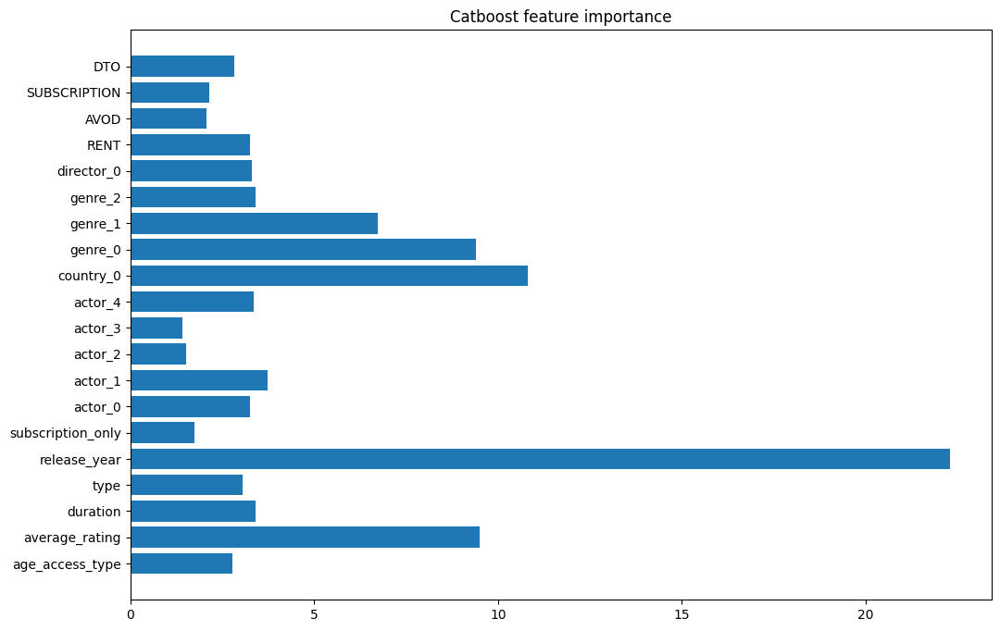

/tmp/ipykernel_1288/2698331858.py:68: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test)
/tmp/ipykernel_1288/2698331858.py:69: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_pred)


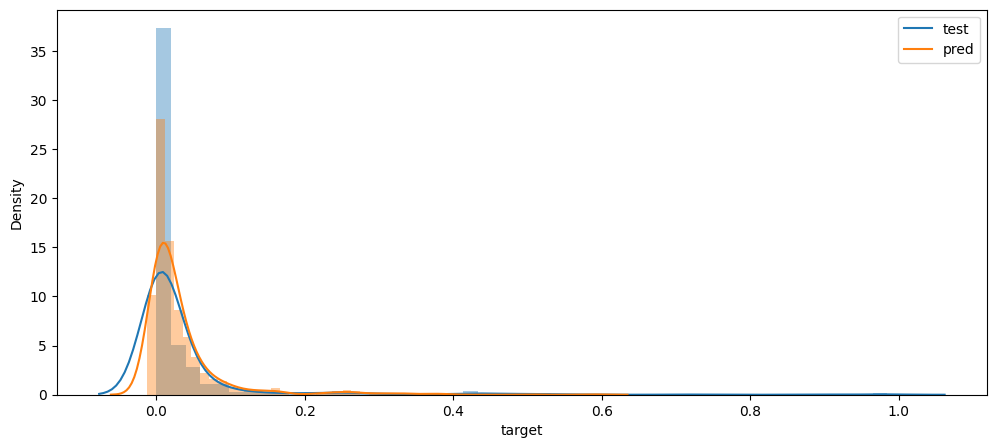

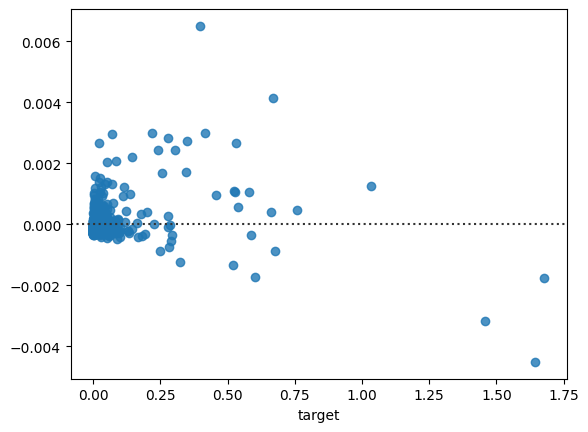

*** VAL **: 
MSE:   0.012441056754196673
RMSE:  0.11153948517989794
R2:    0.346675956166557
MAE:   0.03537858172602844
MedAE: 0.010267799708815577
Adj_R2:  0.34529501335566404
------------------------------


In [65]:
get_importance(train_dataset, cat_model, title='Catboost feature importance', save_fig=False, file_name='cat_feature_importance.png')
draw_target_distr(y_test, y_pred, save_fig=False, file_name='cat_distribution')
draw_residuals(y_test, y_pred, save_fig=False)
calc_metrics(y_test, y_pred, X)

In [66]:
len(y_pred[y_pred <= 0])

104